In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb152.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb154.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb141.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb156.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb144.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb173.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb167.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb147.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb143.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb158.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb160.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb148.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb168.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb157.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb142.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb150.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Val/F/mdb153.pgm
/kaggle/input/

/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb182.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb220.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb292.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb275.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb023.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb073.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb233.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb084.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb056.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb218.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb048.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb270.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb178.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb050.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb217.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data/Train/G/mdb008.pgm
/kaggle/input/mias-classes-gdf/MIAS_Data

In [5]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.applications import *
from tensorflow.keras.preprocessing.image import *
from tensorflow.keras.utils import plot_model
!pip install livelossplot
from livelossplot import PlotLossesKeras
from tensorflow.keras.callbacks import *
from tensorflow.keras import backend as K
import os
from PIL import Image
import cv2
from collections import Counter
!pip install imutils
from imutils import *
from scipy.spatial.distance import cosine, euclidean
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import seaborn as sns
!pip install plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly as ply
from sklearn.metrics import *
ply.offline.init_notebook_mode(connected=True)
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
import os
import pandas as pd
import torch
from torch.utils.data import Dataset 
import cv2
from PIL import Image
import numpy as np
from PIL import ImageFile
import csv
import matplotlib.animation as animation
from IPython.display import HTML
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch.nn.functional as F
from IPython.display import display
to_pil = torchvision.transforms.ToPILImage()
import random
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [43]:
# Root directory for dataset
dataroot = "../input/mias-d/MIAS_D/Train"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 16

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 256

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 200

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [4]:
#Defining the transformations to be applied on the images
transform = transforms.Compose([
    transforms.Resize((256 ,256)) , 
    transforms.ToTensor() , 
    transforms.Normalize((0.5 , 0.5 , 0.5), (0.5 , 0.5 , 0.5)),
])

# Creating the dataset by using the ImageFolder class
dataset = torchvision.datasets.ImageFolder(root = dataroot, transform = transform)

#loading the data using pytorch's DataLoader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, drop_last = True, shuffle=True)

# Defining the device. Here we will be using an Nvidia GPU in order to train the Neural Network.
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

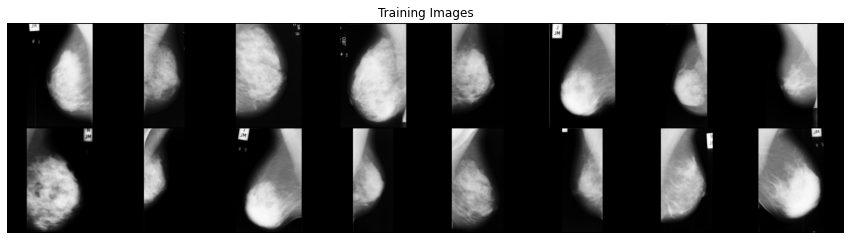

In [5]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,10))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [44]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution

            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            
            nn.ConvTranspose2d(ngf * 4, ngf * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8

            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            
            nn.ConvTranspose2d( ngf, ngf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            
            nn.ConvTranspose2d( ngf, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            
            nn.ConvTranspose2d( ngf, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [45]:
# Create the generator
netG = Generator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchNorm

In [46]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 256 x 256
            nn.Conv2d(nc, ndf , 4, 4, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            
            # input is (ndf) x128 x 128
            nn.Conv2d(ndf, ndf * 2, 4, 4, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            # input is (ndf*2)x 32 X 32
            nn.Conv2d(ndf*2, ndf*4, 4, 4, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            
#             # input is (ndf*4)X 32 X 32
#             nn.Conv2d(ndf*4, ndf * 8, 8, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 8),
#             nn.LeakyReLU(0.2, inplace=True),
            
            
#             # input is (ndf*8)x 16 X 16
#             nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 16),
#             nn.LeakyReLU(0.2, inplace=True),
            
#             # input is (ndf*16)x 16 X 16
#             nn.Conv2d(ndf * 16, ndf * 32, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 32),
#             nn.LeakyReLU(0.2, inplace=True),
            
        
#             nn.Conv2d(ndf * 32, 1, 4, 1, 0, bias=False),
#             nn.Sigmoid()
            
        )

    def forward(self, input):
        return self.main(input)

In [47]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(4, 4), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(4, 4), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(4, 4), padding=(1, 1), bias=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)


In [48]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [49]:

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(tqdm(dataloader, 0)):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1


Starting Training Loop...


  0%|          | 0/4 [00:00<?, ?it/s]

[0/200][0/4]	Loss_D: 1.3910	Loss_G: 1.5849	D(x): 0.6052	D(G(z)): 0.5737 / 0.2121


  0%|          | 0/4 [00:00<?, ?it/s]

[1/200][0/4]	Loss_D: 1.9857	Loss_G: 1.1826	D(x): 0.9032	D(G(z)): 0.8347 / 0.3186


  0%|          | 0/4 [00:00<?, ?it/s]

[2/200][0/4]	Loss_D: 2.0848	Loss_G: 1.4470	D(x): 0.8843	D(G(z)): 0.8540 / 0.2412


  0%|          | 0/4 [00:00<?, ?it/s]

[3/200][0/4]	Loss_D: 1.6440	Loss_G: 2.2135	D(x): 0.8513	D(G(z)): 0.7555 / 0.1169


  0%|          | 0/4 [00:00<?, ?it/s]

[4/200][0/4]	Loss_D: 1.7276	Loss_G: 2.4533	D(x): 0.8377	D(G(z)): 0.7799 / 0.0898


  0%|          | 0/4 [00:00<?, ?it/s]

[5/200][0/4]	Loss_D: 1.6338	Loss_G: 2.7117	D(x): 0.8868	D(G(z)): 0.7760 / 0.0676


  0%|          | 0/4 [00:00<?, ?it/s]

[6/200][0/4]	Loss_D: 1.6526	Loss_G: 2.9456	D(x): 0.7887	D(G(z)): 0.6944 / 0.0536


  0%|          | 0/4 [00:00<?, ?it/s]

[7/200][0/4]	Loss_D: 1.2842	Loss_G: 3.4526	D(x): 0.8532	D(G(z)): 0.6030 / 0.0324


  0%|          | 0/4 [00:00<?, ?it/s]

[8/200][0/4]	Loss_D: 0.9941	Loss_G: 3.9386	D(x): 0.8335	D(G(z)): 0.4434 / 0.0199


  0%|          | 0/4 [00:00<?, ?it/s]

[9/200][0/4]	Loss_D: 0.7071	Loss_G: 4.4643	D(x): 0.9036	D(G(z)): 0.4493 / 0.0117


  0%|          | 0/4 [00:00<?, ?it/s]

[10/200][0/4]	Loss_D: 3.2055	Loss_G: 2.8084	D(x): 0.4259	D(G(z)): 0.8842 / 0.0619


  0%|          | 0/4 [00:00<?, ?it/s]

[11/200][0/4]	Loss_D: 0.6507	Loss_G: 5.0629	D(x): 0.9353	D(G(z)): 0.4327 / 0.0068


  0%|          | 0/4 [00:00<?, ?it/s]

[12/200][0/4]	Loss_D: 0.8976	Loss_G: 5.5475	D(x): 0.7794	D(G(z)): 0.4389 / 0.0040


  0%|          | 0/4 [00:00<?, ?it/s]

[13/200][0/4]	Loss_D: 0.6294	Loss_G: 4.9384	D(x): 0.7786	D(G(z)): 0.2757 / 0.0074


  0%|          | 0/4 [00:00<?, ?it/s]

[14/200][0/4]	Loss_D: 0.5855	Loss_G: 4.6456	D(x): 0.8006	D(G(z)): 0.2718 / 0.0109


  0%|          | 0/4 [00:00<?, ?it/s]

[15/200][0/4]	Loss_D: 1.0916	Loss_G: 5.5116	D(x): 0.8590	D(G(z)): 0.4895 / 0.0041


  0%|          | 0/4 [00:00<?, ?it/s]

[16/200][0/4]	Loss_D: 0.6839	Loss_G: 4.4251	D(x): 0.7480	D(G(z)): 0.1043 / 0.0129


  0%|          | 0/4 [00:00<?, ?it/s]

[17/200][0/4]	Loss_D: 1.0002	Loss_G: 4.0146	D(x): 0.7867	D(G(z)): 0.2418 / 0.0199


  0%|          | 0/4 [00:00<?, ?it/s]

[18/200][0/4]	Loss_D: 0.9928	Loss_G: 3.9256	D(x): 0.7898	D(G(z)): 0.3792 / 0.0202


  0%|          | 0/4 [00:00<?, ?it/s]

[19/200][0/4]	Loss_D: 1.0150	Loss_G: 4.7956	D(x): 0.9097	D(G(z)): 0.3322 / 0.0086


  0%|          | 0/4 [00:00<?, ?it/s]

[20/200][0/4]	Loss_D: 0.2326	Loss_G: 4.4613	D(x): 0.9518	D(G(z)): 0.1630 / 0.0118


  0%|          | 0/4 [00:00<?, ?it/s]

[21/200][0/4]	Loss_D: 0.4966	Loss_G: 4.0390	D(x): 0.8733	D(G(z)): 0.1255 / 0.0196


  0%|          | 0/4 [00:00<?, ?it/s]

[22/200][0/4]	Loss_D: 0.3487	Loss_G: 4.5468	D(x): 0.9159	D(G(z)): 0.1188 / 0.0110


  0%|          | 0/4 [00:00<?, ?it/s]

[23/200][0/4]	Loss_D: 0.1252	Loss_G: 4.3885	D(x): 0.9493	D(G(z)): 0.0682 / 0.0127


  0%|          | 0/4 [00:00<?, ?it/s]

[24/200][0/4]	Loss_D: 0.1996	Loss_G: 4.5626	D(x): 0.8770	D(G(z)): 0.0219 / 0.0107


  0%|          | 0/4 [00:00<?, ?it/s]

[25/200][0/4]	Loss_D: 0.0918	Loss_G: 4.7299	D(x): 0.9763	D(G(z)): 0.0649 / 0.0091


  0%|          | 0/4 [00:00<?, ?it/s]

[26/200][0/4]	Loss_D: 0.1950	Loss_G: 4.8123	D(x): 0.9644	D(G(z)): 0.1425 / 0.0087


  0%|          | 0/4 [00:00<?, ?it/s]

[27/200][0/4]	Loss_D: 0.1019	Loss_G: 4.5182	D(x): 0.9806	D(G(z)): 0.0784 / 0.0119


  0%|          | 0/4 [00:00<?, ?it/s]

[28/200][0/4]	Loss_D: 0.6399	Loss_G: 3.9400	D(x): 0.7723	D(G(z)): 0.2305 / 0.0205


  0%|          | 0/4 [00:00<?, ?it/s]

[29/200][0/4]	Loss_D: 0.5355	Loss_G: 8.7448	D(x): 0.8733	D(G(z)): 0.0060 / 0.0002


  0%|          | 0/4 [00:00<?, ?it/s]

[30/200][0/4]	Loss_D: 0.0520	Loss_G: 6.8167	D(x): 0.9833	D(G(z)): 0.0338 / 0.0011


  0%|          | 0/4 [00:00<?, ?it/s]

[31/200][0/4]	Loss_D: 0.5016	Loss_G: 6.7243	D(x): 0.9706	D(G(z)): 0.3742 / 0.0012


  0%|          | 0/4 [00:00<?, ?it/s]

[32/200][0/4]	Loss_D: 0.3311	Loss_G: 5.3060	D(x): 0.8941	D(G(z)): 0.1029 / 0.0051


  0%|          | 0/4 [00:00<?, ?it/s]

[33/200][0/4]	Loss_D: 0.1432	Loss_G: 5.5609	D(x): 0.9579	D(G(z)): 0.0934 / 0.0039


  0%|          | 0/4 [00:00<?, ?it/s]

[34/200][0/4]	Loss_D: 0.3028	Loss_G: 5.5359	D(x): 0.9725	D(G(z)): 0.2385 / 0.0040


  0%|          | 0/4 [00:00<?, ?it/s]

[35/200][0/4]	Loss_D: 0.1711	Loss_G: 4.4176	D(x): 0.9701	D(G(z)): 0.1274 / 0.0125


  0%|          | 0/4 [00:00<?, ?it/s]

[36/200][0/4]	Loss_D: 0.1196	Loss_G: 4.4639	D(x): 0.9814	D(G(z)): 0.0951 / 0.0123


  0%|          | 0/4 [00:00<?, ?it/s]

[37/200][0/4]	Loss_D: 0.1139	Loss_G: 4.4873	D(x): 0.9881	D(G(z)): 0.0964 / 0.0117


  0%|          | 0/4 [00:00<?, ?it/s]

[38/200][0/4]	Loss_D: 0.1103	Loss_G: 4.5294	D(x): 0.9671	D(G(z)): 0.0716 / 0.0119


  0%|          | 0/4 [00:00<?, ?it/s]

[39/200][0/4]	Loss_D: 0.0784	Loss_G: 4.7238	D(x): 0.9903	D(G(z)): 0.0660 / 0.0100


  0%|          | 0/4 [00:00<?, ?it/s]

[40/200][0/4]	Loss_D: 0.1001	Loss_G: 4.6277	D(x): 0.9979	D(G(z)): 0.0926 / 0.0109


  0%|          | 0/4 [00:00<?, ?it/s]

[41/200][0/4]	Loss_D: 0.0787	Loss_G: 4.7442	D(x): 0.9975	D(G(z)): 0.0729 / 0.0099


  0%|          | 0/4 [00:00<?, ?it/s]

[42/200][0/4]	Loss_D: 0.0664	Loss_G: 4.9069	D(x): 0.9914	D(G(z)): 0.0556 / 0.0088


  0%|          | 0/4 [00:00<?, ?it/s]

[43/200][0/4]	Loss_D: 0.0947	Loss_G: 4.7419	D(x): 0.9912	D(G(z)): 0.0817 / 0.0094


  0%|          | 0/4 [00:00<?, ?it/s]

[44/200][0/4]	Loss_D: 0.1010	Loss_G: 4.6343	D(x): 0.9761	D(G(z)): 0.0736 / 0.0100


  0%|          | 0/4 [00:00<?, ?it/s]

[45/200][0/4]	Loss_D: 0.1649	Loss_G: 4.8312	D(x): 0.9866	D(G(z)): 0.1383 / 0.0092


  0%|          | 0/4 [00:00<?, ?it/s]

[46/200][0/4]	Loss_D: 0.1804	Loss_G: 4.5899	D(x): 0.9831	D(G(z)): 0.1493 / 0.0109


  0%|          | 0/4 [00:00<?, ?it/s]

[47/200][0/4]	Loss_D: 0.0454	Loss_G: 4.7143	D(x): 0.9838	D(G(z)): 0.0284 / 0.0099


  0%|          | 0/4 [00:00<?, ?it/s]

[48/200][0/4]	Loss_D: 0.0647	Loss_G: 4.7959	D(x): 0.9823	D(G(z)): 0.0450 / 0.0096


  0%|          | 0/4 [00:00<?, ?it/s]

[49/200][0/4]	Loss_D: 0.1418	Loss_G: 4.5763	D(x): 0.9382	D(G(z)): 0.0611 / 0.0113


  0%|          | 0/4 [00:00<?, ?it/s]

[50/200][0/4]	Loss_D: 0.1102	Loss_G: 4.5822	D(x): 0.9751	D(G(z)): 0.0795 / 0.0109


  0%|          | 0/4 [00:00<?, ?it/s]

[51/200][0/4]	Loss_D: 0.0991	Loss_G: 4.9596	D(x): 0.9885	D(G(z)): 0.0833 / 0.0077


  0%|          | 0/4 [00:00<?, ?it/s]

[52/200][0/4]	Loss_D: 0.0936	Loss_G: 4.2755	D(x): 0.9750	D(G(z)): 0.0648 / 0.0156


  0%|          | 0/4 [00:00<?, ?it/s]

[53/200][0/4]	Loss_D: 0.0340	Loss_G: 5.3493	D(x): 0.9804	D(G(z)): 0.0137 / 0.0050


  0%|          | 0/4 [00:00<?, ?it/s]

[54/200][0/4]	Loss_D: 0.0797	Loss_G: 5.0508	D(x): 0.9588	D(G(z)): 0.0354 / 0.0069


  0%|          | 0/4 [00:00<?, ?it/s]

[55/200][0/4]	Loss_D: 0.0486	Loss_G: 4.7744	D(x): 0.9864	D(G(z)): 0.0341 / 0.0089


  0%|          | 0/4 [00:00<?, ?it/s]

[56/200][0/4]	Loss_D: 0.0605	Loss_G: 4.7664	D(x): 0.9738	D(G(z)): 0.0320 / 0.0092


  0%|          | 0/4 [00:00<?, ?it/s]

[57/200][0/4]	Loss_D: 0.1551	Loss_G: 5.4801	D(x): 0.9882	D(G(z)): 0.1316 / 0.0046


  0%|          | 0/4 [00:00<?, ?it/s]

[58/200][0/4]	Loss_D: 0.0547	Loss_G: 4.9785	D(x): 0.9904	D(G(z)): 0.0436 / 0.0081


  0%|          | 0/4 [00:00<?, ?it/s]

[59/200][0/4]	Loss_D: 0.0448	Loss_G: 5.4007	D(x): 0.9822	D(G(z)): 0.0260 / 0.0050


  0%|          | 0/4 [00:00<?, ?it/s]

[60/200][0/4]	Loss_D: 0.0859	Loss_G: 4.8300	D(x): 0.9380	D(G(z)): 0.0182 / 0.0086


  0%|          | 0/4 [00:00<?, ?it/s]

[61/200][0/4]	Loss_D: 0.1248	Loss_G: 5.7953	D(x): 0.9809	D(G(z)): 0.0988 / 0.0033


  0%|          | 0/4 [00:00<?, ?it/s]

[62/200][0/4]	Loss_D: 0.0814	Loss_G: 5.0440	D(x): 0.9787	D(G(z)): 0.0573 / 0.0068


  0%|          | 0/4 [00:00<?, ?it/s]

[63/200][0/4]	Loss_D: 0.0460	Loss_G: 5.5580	D(x): 0.9775	D(G(z)): 0.0225 / 0.0041


  0%|          | 0/4 [00:00<?, ?it/s]

[64/200][0/4]	Loss_D: 0.0916	Loss_G: 5.7725	D(x): 0.9907	D(G(z)): 0.0785 / 0.0033


  0%|          | 0/4 [00:00<?, ?it/s]

[65/200][0/4]	Loss_D: 0.0221	Loss_G: 5.3376	D(x): 0.9920	D(G(z)): 0.0139 / 0.0050


  0%|          | 0/4 [00:00<?, ?it/s]

[66/200][0/4]	Loss_D: 0.0249	Loss_G: 5.1501	D(x): 0.9922	D(G(z)): 0.0169 / 0.0060


  0%|          | 0/4 [00:00<?, ?it/s]

[67/200][0/4]	Loss_D: 0.0400	Loss_G: 4.8169	D(x): 0.9911	D(G(z)): 0.0304 / 0.0086


  0%|          | 0/4 [00:00<?, ?it/s]

[68/200][0/4]	Loss_D: 0.0219	Loss_G: 5.3077	D(x): 0.9952	D(G(z)): 0.0169 / 0.0053


  0%|          | 0/4 [00:00<?, ?it/s]

[69/200][0/4]	Loss_D: 0.0324	Loss_G: 5.1778	D(x): 0.9878	D(G(z)): 0.0196 / 0.0061


  0%|          | 0/4 [00:00<?, ?it/s]

[70/200][0/4]	Loss_D: 0.0777	Loss_G: 5.2018	D(x): 0.9898	D(G(z)): 0.0650 / 0.0058


  0%|          | 0/4 [00:00<?, ?it/s]

[71/200][0/4]	Loss_D: 0.0434	Loss_G: 5.2360	D(x): 0.9939	D(G(z)): 0.0365 / 0.0055


  0%|          | 0/4 [00:00<?, ?it/s]

[72/200][0/4]	Loss_D: 0.0533	Loss_G: 5.6418	D(x): 0.9942	D(G(z)): 0.0462 / 0.0038


  0%|          | 0/4 [00:00<?, ?it/s]

[73/200][0/4]	Loss_D: 0.0481	Loss_G: 5.1612	D(x): 0.9862	D(G(z)): 0.0335 / 0.0060


  0%|          | 0/4 [00:00<?, ?it/s]

[74/200][0/4]	Loss_D: 0.0428	Loss_G: 5.2234	D(x): 0.9861	D(G(z)): 0.0283 / 0.0055


  0%|          | 0/4 [00:00<?, ?it/s]

[75/200][0/4]	Loss_D: 0.0307	Loss_G: 5.3670	D(x): 0.9835	D(G(z)): 0.0137 / 0.0049


  0%|          | 0/4 [00:00<?, ?it/s]

[76/200][0/4]	Loss_D: 0.0297	Loss_G: 5.5395	D(x): 0.9905	D(G(z)): 0.0200 / 0.0041


  0%|          | 0/4 [00:00<?, ?it/s]

[77/200][0/4]	Loss_D: 0.0620	Loss_G: 5.2824	D(x): 0.9844	D(G(z)): 0.0448 / 0.0053


  0%|          | 0/4 [00:00<?, ?it/s]

[78/200][0/4]	Loss_D: 0.0382	Loss_G: 5.2113	D(x): 0.9898	D(G(z)): 0.0275 / 0.0057


  0%|          | 0/4 [00:00<?, ?it/s]

[79/200][0/4]	Loss_D: 0.0404	Loss_G: 5.1646	D(x): 0.9890	D(G(z)): 0.0287 / 0.0060


  0%|          | 0/4 [00:00<?, ?it/s]

[80/200][0/4]	Loss_D: 0.0133	Loss_G: 5.6184	D(x): 0.9956	D(G(z)): 0.0088 / 0.0037


  0%|          | 0/4 [00:00<?, ?it/s]

[81/200][0/4]	Loss_D: 0.0552	Loss_G: 5.4262	D(x): 0.9858	D(G(z)): 0.0398 / 0.0045


  0%|          | 0/4 [00:00<?, ?it/s]

[82/200][0/4]	Loss_D: 0.0316	Loss_G: 5.3861	D(x): 0.9937	D(G(z)): 0.0248 / 0.0049


  0%|          | 0/4 [00:00<?, ?it/s]

[83/200][0/4]	Loss_D: 0.0405	Loss_G: 5.5002	D(x): 0.9981	D(G(z)): 0.0378 / 0.0044


  0%|          | 0/4 [00:00<?, ?it/s]

[84/200][0/4]	Loss_D: 0.0435	Loss_G: 5.3165	D(x): 0.9978	D(G(z)): 0.0404 / 0.0051


  0%|          | 0/4 [00:00<?, ?it/s]

[85/200][0/4]	Loss_D: 0.0328	Loss_G: 5.0322	D(x): 0.9914	D(G(z)): 0.0237 / 0.0067


  0%|          | 0/4 [00:00<?, ?it/s]

[86/200][0/4]	Loss_D: 0.0427	Loss_G: 4.8566	D(x): 0.9745	D(G(z)): 0.0159 / 0.0081


  0%|          | 0/4 [00:00<?, ?it/s]

[87/200][0/4]	Loss_D: 0.0185	Loss_G: 5.5066	D(x): 0.9980	D(G(z)): 0.0164 / 0.0041


  0%|          | 0/4 [00:00<?, ?it/s]

[88/200][0/4]	Loss_D: 0.0201	Loss_G: 5.4983	D(x): 0.9990	D(G(z)): 0.0189 / 0.0042


  0%|          | 0/4 [00:00<?, ?it/s]

[89/200][0/4]	Loss_D: 0.0431	Loss_G: 5.2932	D(x): 0.9775	D(G(z)): 0.0189 / 0.0054


  0%|          | 0/4 [00:00<?, ?it/s]

[90/200][0/4]	Loss_D: 0.0259	Loss_G: 5.8100	D(x): 0.9957	D(G(z)): 0.0214 / 0.0031


  0%|          | 0/4 [00:00<?, ?it/s]

[91/200][0/4]	Loss_D: 0.0446	Loss_G: 5.4183	D(x): 0.9958	D(G(z)): 0.0395 / 0.0046


  0%|          | 0/4 [00:00<?, ?it/s]

[92/200][0/4]	Loss_D: 0.0302	Loss_G: 5.3598	D(x): 0.9849	D(G(z)): 0.0148 / 0.0050


  0%|          | 0/4 [00:00<?, ?it/s]

[93/200][0/4]	Loss_D: 0.1560	Loss_G: 4.1018	D(x): 0.8969	D(G(z)): 0.0173 / 0.0169


  0%|          | 0/4 [00:00<?, ?it/s]

[94/200][0/4]	Loss_D: 0.0159	Loss_G: 5.5847	D(x): 0.9997	D(G(z)): 0.0154 / 0.0039


  0%|          | 0/4 [00:00<?, ?it/s]

[95/200][0/4]	Loss_D: 0.0328	Loss_G: 6.2737	D(x): 0.9991	D(G(z)): 0.0314 / 0.0019


  0%|          | 0/4 [00:00<?, ?it/s]

[96/200][0/4]	Loss_D: 0.0193	Loss_G: 5.8493	D(x): 0.9989	D(G(z)): 0.0180 / 0.0030


  0%|          | 0/4 [00:00<?, ?it/s]

[97/200][0/4]	Loss_D: 0.0164	Loss_G: 6.1069	D(x): 0.9969	D(G(z)): 0.0132 / 0.0023


  0%|          | 0/4 [00:00<?, ?it/s]

[98/200][0/4]	Loss_D: 0.0222	Loss_G: 6.2304	D(x): 0.9965	D(G(z)): 0.0185 / 0.0020


  0%|          | 0/4 [00:00<?, ?it/s]

[99/200][0/4]	Loss_D: 0.0139	Loss_G: 5.8005	D(x): 0.9948	D(G(z)): 0.0086 / 0.0031


  0%|          | 0/4 [00:00<?, ?it/s]

[100/200][0/4]	Loss_D: 0.0361	Loss_G: 5.7566	D(x): 0.9969	D(G(z)): 0.0324 / 0.0032


  0%|          | 0/4 [00:00<?, ?it/s]

[101/200][0/4]	Loss_D: 0.0302	Loss_G: 5.6714	D(x): 0.9871	D(G(z)): 0.0168 / 0.0035


  0%|          | 0/4 [00:00<?, ?it/s]

[102/200][0/4]	Loss_D: 0.0273	Loss_G: 5.9841	D(x): 0.9984	D(G(z)): 0.0253 / 0.0026


  0%|          | 0/4 [00:00<?, ?it/s]

[103/200][0/4]	Loss_D: 0.0355	Loss_G: 6.1389	D(x): 0.9941	D(G(z)): 0.0291 / 0.0023


  0%|          | 0/4 [00:00<?, ?it/s]

[104/200][0/4]	Loss_D: 0.0096	Loss_G: 6.3187	D(x): 0.9954	D(G(z)): 0.0050 / 0.0019


  0%|          | 0/4 [00:00<?, ?it/s]

[105/200][0/4]	Loss_D: 0.0843	Loss_G: 5.6591	D(x): 0.9536	D(G(z)): 0.0318 / 0.0036


  0%|          | 0/4 [00:00<?, ?it/s]

[106/200][0/4]	Loss_D: 0.0527	Loss_G: 5.9992	D(x): 0.9807	D(G(z)): 0.0313 / 0.0025


  0%|          | 0/4 [00:00<?, ?it/s]

[107/200][0/4]	Loss_D: 0.0151	Loss_G: 5.8994	D(x): 0.9972	D(G(z)): 0.0122 / 0.0028


  0%|          | 0/4 [00:00<?, ?it/s]

[108/200][0/4]	Loss_D: 0.0271	Loss_G: 6.0671	D(x): 0.9953	D(G(z)): 0.0221 / 0.0024


  0%|          | 0/4 [00:00<?, ?it/s]

[109/200][0/4]	Loss_D: 0.0221	Loss_G: 6.3214	D(x): 0.9877	D(G(z)): 0.0093 / 0.0019


  0%|          | 0/4 [00:00<?, ?it/s]

[110/200][0/4]	Loss_D: 0.0317	Loss_G: 6.4473	D(x): 0.9960	D(G(z)): 0.0273 / 0.0016


  0%|          | 0/4 [00:00<?, ?it/s]

[111/200][0/4]	Loss_D: 0.0700	Loss_G: 11.7529	D(x): 0.9365	D(G(z)): 0.0001 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[112/200][0/4]	Loss_D: 0.0097	Loss_G: 5.4226	D(x): 0.9994	D(G(z)): 0.0091 / 0.0045


  0%|          | 0/4 [00:00<?, ?it/s]

[113/200][0/4]	Loss_D: 0.0246	Loss_G: 5.3526	D(x): 0.9985	D(G(z)): 0.0228 / 0.0049


  0%|          | 0/4 [00:00<?, ?it/s]

[114/200][0/4]	Loss_D: 0.0488	Loss_G: 4.9782	D(x): 0.9674	D(G(z)): 0.0146 / 0.0069


  0%|          | 0/4 [00:00<?, ?it/s]

[115/200][0/4]	Loss_D: 0.0222	Loss_G: 5.4195	D(x): 0.9986	D(G(z)): 0.0205 / 0.0046


  0%|          | 0/4 [00:00<?, ?it/s]

[116/200][0/4]	Loss_D: 0.0305	Loss_G: 5.5478	D(x): 0.9980	D(G(z)): 0.0282 / 0.0039


  0%|          | 0/4 [00:00<?, ?it/s]

[117/200][0/4]	Loss_D: 0.0171	Loss_G: 5.7591	D(x): 0.9947	D(G(z)): 0.0116 / 0.0032


  0%|          | 0/4 [00:00<?, ?it/s]

[118/200][0/4]	Loss_D: 0.0260	Loss_G: 5.9713	D(x): 0.9955	D(G(z)): 0.0212 / 0.0026


  0%|          | 0/4 [00:00<?, ?it/s]

[119/200][0/4]	Loss_D: 0.0219	Loss_G: 5.4935	D(x): 0.9894	D(G(z)): 0.0110 / 0.0042


  0%|          | 0/4 [00:00<?, ?it/s]

[120/200][0/4]	Loss_D: 0.0269	Loss_G: 5.6675	D(x): 0.9972	D(G(z)): 0.0238 / 0.0035


  0%|          | 0/4 [00:00<?, ?it/s]

[121/200][0/4]	Loss_D: 0.0500	Loss_G: 5.1138	D(x): 0.9743	D(G(z)): 0.0230 / 0.0061


  0%|          | 0/4 [00:00<?, ?it/s]

[122/200][0/4]	Loss_D: 0.0320	Loss_G: 5.4415	D(x): 0.9929	D(G(z)): 0.0245 / 0.0045


  0%|          | 0/4 [00:00<?, ?it/s]

[123/200][0/4]	Loss_D: 0.0196	Loss_G: 6.0001	D(x): 0.9870	D(G(z)): 0.0064 / 0.0025


  0%|          | 0/4 [00:00<?, ?it/s]

[124/200][0/4]	Loss_D: 0.0359	Loss_G: 5.9348	D(x): 0.9887	D(G(z)): 0.0240 / 0.0027


  0%|          | 0/4 [00:00<?, ?it/s]

[125/200][0/4]	Loss_D: 0.0604	Loss_G: 6.4301	D(x): 0.9981	D(G(z)): 0.0567 / 0.0016


  0%|          | 0/4 [00:00<?, ?it/s]

[126/200][0/4]	Loss_D: 0.0096	Loss_G: 5.9157	D(x): 0.9995	D(G(z)): 0.0091 / 0.0028


  0%|          | 0/4 [00:00<?, ?it/s]

[127/200][0/4]	Loss_D: 0.0449	Loss_G: 6.2939	D(x): 0.9970	D(G(z)): 0.0410 / 0.0019


  0%|          | 0/4 [00:00<?, ?it/s]

[128/200][0/4]	Loss_D: 0.0109	Loss_G: 5.7623	D(x): 0.9951	D(G(z)): 0.0059 / 0.0032


  0%|          | 0/4 [00:00<?, ?it/s]

[129/200][0/4]	Loss_D: 0.0270	Loss_G: 5.8433	D(x): 0.9810	D(G(z)): 0.0074 / 0.0029


  0%|          | 0/4 [00:00<?, ?it/s]

[130/200][0/4]	Loss_D: 0.0184	Loss_G: 5.7905	D(x): 0.9971	D(G(z)): 0.0153 / 0.0031


  0%|          | 0/4 [00:00<?, ?it/s]

[131/200][0/4]	Loss_D: 0.0141	Loss_G: 5.7886	D(x): 0.9952	D(G(z)): 0.0093 / 0.0031


  0%|          | 0/4 [00:00<?, ?it/s]

[132/200][0/4]	Loss_D: 0.0686	Loss_G: 8.3468	D(x): 0.9948	D(G(z)): 0.0613 / 0.0002


  0%|          | 0/4 [00:00<?, ?it/s]

[133/200][0/4]	Loss_D: 0.0324	Loss_G: 5.8513	D(x): 0.9844	D(G(z)): 0.0163 / 0.0029


  0%|          | 0/4 [00:00<?, ?it/s]

[134/200][0/4]	Loss_D: 0.0150	Loss_G: 6.8262	D(x): 0.9985	D(G(z)): 0.0134 / 0.0011


  0%|          | 0/4 [00:00<?, ?it/s]

[135/200][0/4]	Loss_D: 0.0212	Loss_G: 5.9390	D(x): 0.9943	D(G(z)): 0.0153 / 0.0027


  0%|          | 0/4 [00:00<?, ?it/s]

[136/200][0/4]	Loss_D: 0.0181	Loss_G: 6.2171	D(x): 0.9915	D(G(z)): 0.0094 / 0.0020


  0%|          | 0/4 [00:00<?, ?it/s]

[137/200][0/4]	Loss_D: 0.0174	Loss_G: 5.8808	D(x): 0.9978	D(G(z)): 0.0151 / 0.0028


  0%|          | 0/4 [00:00<?, ?it/s]

[138/200][0/4]	Loss_D: 0.0216	Loss_G: 6.1172	D(x): 0.9925	D(G(z)): 0.0139 / 0.0022


  0%|          | 0/4 [00:00<?, ?it/s]

[139/200][0/4]	Loss_D: 0.2118	Loss_G: 12.2432	D(x): 0.9772	D(G(z)): 0.1713 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[140/200][0/4]	Loss_D: 0.2027	Loss_G: 2.6069	D(x): 0.8845	D(G(z)): 0.0082 / 0.0741


  0%|          | 0/4 [00:00<?, ?it/s]

[141/200][0/4]	Loss_D: 7.2364	Loss_G: 10.1731	D(x): 1.0000	D(G(z)): 0.9993 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[142/200][0/4]	Loss_D: 0.2420	Loss_G: 7.2250	D(x): 1.0000	D(G(z)): 0.2142 / 0.0007


  0%|          | 0/4 [00:00<?, ?it/s]

[143/200][0/4]	Loss_D: 0.8810	Loss_G: 20.0810	D(x): 0.9529	D(G(z)): 0.5475 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[144/200][0/4]	Loss_D: 0.0234	Loss_G: 12.7936	D(x): 0.9801	D(G(z)): 0.0000 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[145/200][0/4]	Loss_D: 0.1402	Loss_G: 18.5811	D(x): 0.9120	D(G(z)): 0.0000 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[146/200][0/4]	Loss_D: 0.0005	Loss_G: 7.7245	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004


  0%|          | 0/4 [00:00<?, ?it/s]

[147/200][0/4]	Loss_D: 0.0427	Loss_G: 6.2639	D(x): 0.9999	D(G(z)): 0.0416 / 0.0019


  0%|          | 0/4 [00:00<?, ?it/s]

[148/200][0/4]	Loss_D: 0.2344	Loss_G: 8.0974	D(x): 0.9648	D(G(z)): 0.1692 / 0.0003


  0%|          | 0/4 [00:00<?, ?it/s]

[149/200][0/4]	Loss_D: 0.2783	Loss_G: 10.2968	D(x): 0.8643	D(G(z)): 0.0009 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[150/200][0/4]	Loss_D: 0.2961	Loss_G: 19.8272	D(x): 0.8319	D(G(z)): 0.0000 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[151/200][0/4]	Loss_D: 0.0009	Loss_G: 8.6335	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002


  0%|          | 0/4 [00:00<?, ?it/s]

[152/200][0/4]	Loss_D: 0.0120	Loss_G: 9.6736	D(x): 0.9920	D(G(z)): 0.0038 / 0.0001


  0%|          | 0/4 [00:00<?, ?it/s]

[153/200][0/4]	Loss_D: 0.0539	Loss_G: 11.5391	D(x): 0.9575	D(G(z)): 0.0009 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[154/200][0/4]	Loss_D: 3.6937	Loss_G: 13.4549	D(x): 0.2880	D(G(z)): 0.0000 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[155/200][0/4]	Loss_D: 0.7150	Loss_G: 25.5219	D(x): 0.8484	D(G(z)): 0.0000 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[156/200][0/4]	Loss_D: 1.2642	Loss_G: 15.3689	D(x): 1.0000	D(G(z)): 0.5888 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[157/200][0/4]	Loss_D: 2.4749	Loss_G: 25.4275	D(x): 0.9992	D(G(z)): 0.8170 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[158/200][0/4]	Loss_D: 0.3264	Loss_G: 11.4485	D(x): 0.8515	D(G(z)): 0.0080 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[159/200][0/4]	Loss_D: 0.0137	Loss_G: 8.1468	D(x): 0.9883	D(G(z)): 0.0017 / 0.0005


  0%|          | 0/4 [00:00<?, ?it/s]

[160/200][0/4]	Loss_D: 0.1835	Loss_G: 8.1217	D(x): 0.9306	D(G(z)): 0.0940 / 0.0003


  0%|          | 0/4 [00:00<?, ?it/s]

[161/200][0/4]	Loss_D: 5.8775	Loss_G: 12.5442	D(x): 0.0099	D(G(z)): 0.0000 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[162/200][0/4]	Loss_D: 0.2773	Loss_G: 5.2081	D(x): 0.8963	D(G(z)): 0.0015 / 0.0070


  0%|          | 0/4 [00:00<?, ?it/s]

[163/200][0/4]	Loss_D: 5.1753	Loss_G: 14.1159	D(x): 0.9931	D(G(z)): 0.9338 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[164/200][0/4]	Loss_D: 5.1852	Loss_G: 3.1642	D(x): 0.0572	D(G(z)): 0.0002 / 0.0735


  0%|          | 0/4 [00:00<?, ?it/s]

[165/200][0/4]	Loss_D: 0.5009	Loss_G: 5.1567	D(x): 0.7428	D(G(z)): 0.0572 / 0.0065


  0%|          | 0/4 [00:00<?, ?it/s]

[166/200][0/4]	Loss_D: 0.0580	Loss_G: 7.3707	D(x): 0.9946	D(G(z)): 0.0512 / 0.0006


  0%|          | 0/4 [00:00<?, ?it/s]

[167/200][0/4]	Loss_D: 3.9094	Loss_G: 12.6477	D(x): 0.9984	D(G(z)): 0.9382 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[168/200][0/4]	Loss_D: 1.9476	Loss_G: 2.7267	D(x): 0.3895	D(G(z)): 0.0011 / 0.0809


  0%|          | 0/4 [00:00<?, ?it/s]

[169/200][0/4]	Loss_D: 0.5070	Loss_G: 7.6219	D(x): 0.9656	D(G(z)): 0.3529 / 0.0005


  0%|          | 0/4 [00:00<?, ?it/s]

[170/200][0/4]	Loss_D: 7.1914	Loss_G: 6.3646	D(x): 0.0152	D(G(z)): 0.0000 / 0.0018


  0%|          | 0/4 [00:00<?, ?it/s]

[171/200][0/4]	Loss_D: 1.5129	Loss_G: 6.5356	D(x): 0.8619	D(G(z)): 0.6337 / 0.0016


  0%|          | 0/4 [00:00<?, ?it/s]

[172/200][0/4]	Loss_D: 1.2368	Loss_G: 6.0435	D(x): 0.5443	D(G(z)): 0.0114 / 0.0028


  0%|          | 0/4 [00:00<?, ?it/s]

[173/200][0/4]	Loss_D: 1.3755	Loss_G: 8.5505	D(x): 0.9298	D(G(z)): 0.6664 / 0.0002


  0%|          | 0/4 [00:00<?, ?it/s]

[174/200][0/4]	Loss_D: 0.2942	Loss_G: 6.4360	D(x): 0.9923	D(G(z)): 0.2465 / 0.0016


  0%|          | 0/4 [00:00<?, ?it/s]

[175/200][0/4]	Loss_D: 1.5727	Loss_G: 9.8187	D(x): 0.5188	D(G(z)): 0.0001 / 0.0001


  0%|          | 0/4 [00:00<?, ?it/s]

[176/200][0/4]	Loss_D: 0.2172	Loss_G: 4.7762	D(x): 0.9211	D(G(z)): 0.1089 / 0.0105


  0%|          | 0/4 [00:00<?, ?it/s]

[177/200][0/4]	Loss_D: 0.7005	Loss_G: 3.5737	D(x): 0.7120	D(G(z)): 0.0763 / 0.0304


  0%|          | 0/4 [00:00<?, ?it/s]

[178/200][0/4]	Loss_D: 3.3401	Loss_G: 5.4365	D(x): 0.0939	D(G(z)): 0.0001 / 0.0045


  0%|          | 0/4 [00:00<?, ?it/s]

[179/200][0/4]	Loss_D: 1.0963	Loss_G: 10.8226	D(x): 0.4635	D(G(z)): 0.0001 / 0.0000


  0%|          | 0/4 [00:00<?, ?it/s]

[180/200][0/4]	Loss_D: 0.6469	Loss_G: 5.7167	D(x): 0.7049	D(G(z)): 0.0720 / 0.0055


  0%|          | 0/4 [00:00<?, ?it/s]

[181/200][0/4]	Loss_D: 0.8724	Loss_G: 4.7728	D(x): 0.6940	D(G(z)): 0.1761 / 0.0159


  0%|          | 0/4 [00:00<?, ?it/s]

[182/200][0/4]	Loss_D: 0.3133	Loss_G: 3.3591	D(x): 0.8840	D(G(z)): 0.1302 / 0.0427


  0%|          | 0/4 [00:00<?, ?it/s]

[183/200][0/4]	Loss_D: 1.2562	Loss_G: 3.5051	D(x): 0.4334	D(G(z)): 0.0054 / 0.0321


  0%|          | 0/4 [00:00<?, ?it/s]

[184/200][0/4]	Loss_D: 1.1738	Loss_G: 7.0322	D(x): 0.9016	D(G(z)): 0.6025 / 0.0010


  0%|          | 0/4 [00:00<?, ?it/s]

[185/200][0/4]	Loss_D: 0.6132	Loss_G: 4.8110	D(x): 0.9288	D(G(z)): 0.3944 / 0.0089


  0%|          | 0/4 [00:00<?, ?it/s]

[186/200][0/4]	Loss_D: 0.6105	Loss_G: 5.5052	D(x): 0.8019	D(G(z)): 0.2797 / 0.0043


  0%|          | 0/4 [00:00<?, ?it/s]

[187/200][0/4]	Loss_D: 0.9162	Loss_G: 5.3546	D(x): 0.9127	D(G(z)): 0.4829 / 0.0057


  0%|          | 0/4 [00:00<?, ?it/s]

[188/200][0/4]	Loss_D: 1.1340	Loss_G: 6.8799	D(x): 0.9300	D(G(z)): 0.5940 / 0.0011


  0%|          | 0/4 [00:00<?, ?it/s]

[189/200][0/4]	Loss_D: 0.6517	Loss_G: 2.9629	D(x): 0.8239	D(G(z)): 0.3485 / 0.0525


  0%|          | 0/4 [00:00<?, ?it/s]

[190/200][0/4]	Loss_D: 0.9049	Loss_G: 3.6211	D(x): 0.5948	D(G(z)): 0.0202 / 0.0296


  0%|          | 0/4 [00:00<?, ?it/s]

[191/200][0/4]	Loss_D: 1.8314	Loss_G: 5.6376	D(x): 0.7515	D(G(z)): 0.6957 / 0.0038


  0%|          | 0/4 [00:00<?, ?it/s]

[192/200][0/4]	Loss_D: 0.5541	Loss_G: 3.5571	D(x): 0.7644	D(G(z)): 0.1074 / 0.0335


  0%|          | 0/4 [00:00<?, ?it/s]

[193/200][0/4]	Loss_D: 0.9708	Loss_G: 6.5697	D(x): 0.9385	D(G(z)): 0.5869 / 0.0015


  0%|          | 0/4 [00:00<?, ?it/s]

[194/200][0/4]	Loss_D: 0.2747	Loss_G: 4.4458	D(x): 0.8488	D(G(z)): 0.0973 / 0.0128


  0%|          | 0/4 [00:00<?, ?it/s]

[195/200][0/4]	Loss_D: 0.6862	Loss_G: 4.0328	D(x): 0.7811	D(G(z)): 0.2976 / 0.0191


  0%|          | 0/4 [00:00<?, ?it/s]

[196/200][0/4]	Loss_D: 2.1571	Loss_G: 7.7317	D(x): 0.9695	D(G(z)): 0.8231 / 0.0005


  0%|          | 0/4 [00:00<?, ?it/s]

[197/200][0/4]	Loss_D: 2.9009	Loss_G: 1.7040	D(x): 0.2208	D(G(z)): 0.0803 / 0.2527


  0%|          | 0/4 [00:00<?, ?it/s]

[198/200][0/4]	Loss_D: 1.0089	Loss_G: 6.1687	D(x): 0.8753	D(G(z)): 0.5069 / 0.0025


  0%|          | 0/4 [00:00<?, ?it/s]

[199/200][0/4]	Loss_D: 0.5672	Loss_G: 2.1548	D(x): 0.6764	D(G(z)): 0.0752 / 0.1231


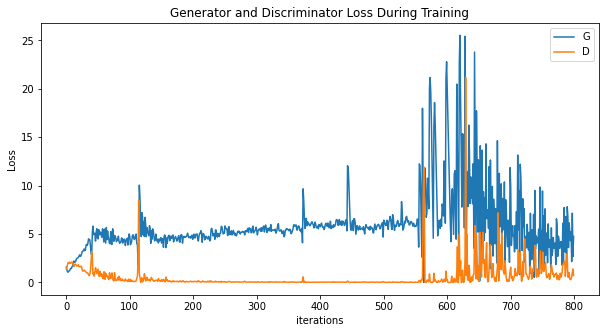

In [50]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

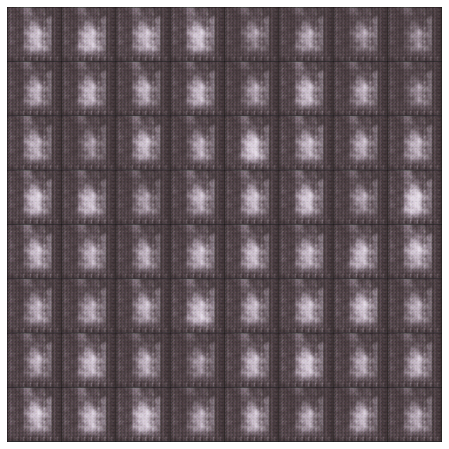

In [52]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

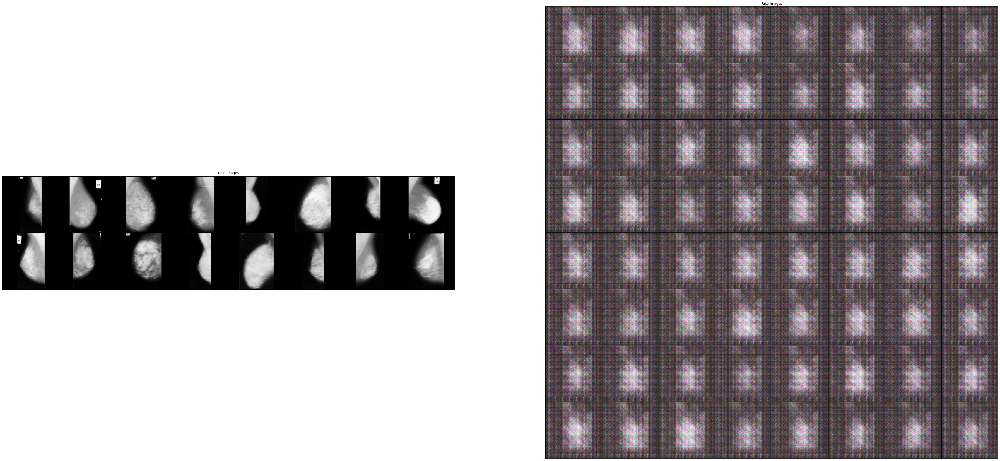

In [51]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(64,64))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()